# MOOGenstien: Synthetic

This notebook performs a synthetic spectrum analysis for a particular star.

## Key Steps:
* Generate an interpolated MARCS atmosphere based on a set of known or requested stellar parameters
* Dertermine [Fe/H] through a semi-interactive and iterative process of identifying/rejecting good/bad Fe lines
* Determine [X/H] for isolated lines (no blends) or lines WITHOUT HFS corrections

## What this notebook is good for:
* Determining [Fe/H] from known Teff and logg
* Synthesizing isolated lines (no blends) and/or lines without HFS corrections

## What this notebook is NOT good for:
* Determining spectroscopic stellar parameters
* Performing a systematic analysis of stellar parameters
* Synthesizing blened lines or lines with HFS corrections
* Producing paper worhty figures

---
___

In [2]:
%matplotlib nbagg

import os
import sys
import shutil

import numpy as np

from astropy.io import ascii
from astropy.table import Table

# # A bunch of functions to interface with MOOG
# import moog_funcs as mf

# ----------------- Import the other files of functions
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

import asap_lib.moog_funcs as mf
import asap_lib.auto_atmosphere as aa
import asap_lib.calc_abunds as calc_abunds
import asap_lib.line_list_utils as llu

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [3]:
# Paths to places

# Where we are now and want to work
working_path = os.getcwd() + '/'

# Path to the spectra
spec_path = dataDir+'/final_spectra/'

# Path to send the MOOG output files
synth_out_path = os.path.join( dataDir , 'synthetic/')

In [4]:
# Define the star/object of interest
# This name must match the spectrum name (minus file extension) and will be used for naming later files
name = 'HD222925Blue'

# Path to the full spectrum
'''
Note the spectrum must be continuum normalized and radial velocity corrected AND
in the '.xy' format (one column wavelength one column flux)
'''
spectrum = os.path.join(spec_path, name + '.xy')

---
___

# Create a MARCS model atmosphere

JG: Using your initial estimates of the temperature, surface gravity, and metallicity, create a MARCS model atmosphere. This routine uses "Interpolation of MARCS Stellar Atmosphere Models" by Thomas Masserson (2008)  (to the best of my knowledge this is the verison used)
- A copy of the scripts and manual can be found at `/arc5/home/docker/moog-daospec-skaha/interpol_marcs`
- The actual executable used in the code is found at `/usr/local/bin/interpol_modeles`

In [13]:
params = [4749, 1.12, -2.88]
params_err = [89, 0.11, 0.07]

In [6]:
# Define the model atmosphere name

model_in = name + '.mmod'

# Generate a MARCS model atmosphere and place it in the current working directory

aa.gen_mod_atm(name, params, working_path, print_params=True)

-----------------------------------------------------------------
----------------- Generating a Model Atmosphere -----------------
-----------------------------------------------------------------

----------------- Finding model atmosphere parameters:
-The model atmosphere parameters are: 
['5636 2.54 -1.5 1.83 HD222925Blue']
-Saving model atmosphere parameters to: params.txt 
-Saving atoms to: atoms.txt


----------------- Finding which group of model atmosphere grids to use based on the log g coverage:
-/arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/


----------------- Creating the model atmospheres:
-Reading params.txt
-Grid coverage for models in /arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/:
Temperature range: 3800.0 K - 7500.0 K
Gravity range: 0.0 - 3.5
Metallicity range: -5.0 - 1.0
(Though your stellar parameters may be within the grid boundaries, local gaps may cause problems. Tread carefully.)

------- Starting Model Atmosphere Creation for Star 

gv: Unable to open the display.


### JG: `gv: Unable to open the display.` Work Around
**X11 Forwarding**  
Requires: On Mac, XQuartz downloaded on local computer.  Or equivalent

1. open a terminal and ssh into Polaris with the tag -XY  
    eg: `ssh -XY jglover@206.12.93.169`

2. Navigate to the folder with the moog code      
    eg: `cd GRACES/Code/moog`

3. Open the postscript file with gv   
    eg: `gv interpol_check.ps`
    
    
In a few seconds an XQuatrz window pops up with the plots

**In the future I could probably just delete the line which tries to open the .ps file and let this workaround be the go to method**

___
---

# Step 1: Identify good Fe lines

In this first iteration we will be looking for good Fe lines from a big ol' list of lines

JG: Input the initial list of iron lines to check.  

In [14]:
# Path to the linelists
full_list_path = working_path + 'asap_lib/data/linelists/isolated_fe_lists/'
print(full_list_path)

line_list = 'linelist_best_Fe.txt' # JG: There is another line list 'linelist_4600_6850_Fe_xm.txt' 
print(line_list)

# Copy the linelist here 
# JG: as far as I can tell this is just to prevent accidentaly altering of the master line list
print('Making a copy of '+full_list_path + line_list+' at '+working_path)
shutil.copy2(full_list_path + line_list, working_path)


# JG: Optional addition: Trim the line list copy that was just made to the wavelength range of the spectrum
mf.trim_linelist_2_spectrum(spectrum, line_list, ftype='xy')


# Create a dictionary for the linelist
line_dict = mf.lines_2_dict(line_list, params)

/arc5/home/jglover/ASAP/asap_lib/data/linelists/isolated_fe_lists/
linelist_best_Fe.txt
Making a copy of /arc5/home/jglover/ASAP/asap_lib/data/linelists/isolated_fe_lists/linelist_best_Fe.txt at /arc5/home/jglover/ASAP/
Saving trimmed line list to linelist_best_Fe.txt


In [15]:
# Start with some first guess smoothing parameter for MOOG. This can be refined later.
smogs = [0.17] # 0.15 , Gaussian smoothing kernel in angstroms

# Generate an array of test abundances to get a quick metallicity estimate
# JG: As far as I can tell, the code needs the test abundances to be in increasing order 
test_abunds = np.arange(-2.0, 2.0, 0.1) #Steps of 0.1 dex

#### JG:

- Following cell takes ~2min to run with a line list of ~30
- For each line in the line list (line_dict),
         - Check to see if the line should be treated as an upper limit or not.  If the depth of the line is less than the specified "tolerance", then the line should be treated as an upper limit.  The entry in the line dictionary will be updated to reflect this. upper_lim = 0 means the line depth is greater than the tolerance, and 1 means that it is less than the tolerance
         `'Upper Limit Info': array( [ diff, cont_flux_std, upper_lim         ])`
    - For each smoothing term in smogs,
        - For each test abundance, 
            - Update the batch.par file and run moog to generate a synthetic spectrum  
            - Check to see how well the synthetic specrtrum matches the observed spectrum 
            - Update the line dictionary with this information

- Got a mysterious error where the code couldn't find the .sout file?  Try shortening the name of your spectrum and running the notebook again. Moog can't seem to deal with file names that are super long or something (I honeslty don't really understand why)

<IPython.core.display.Javascript object>


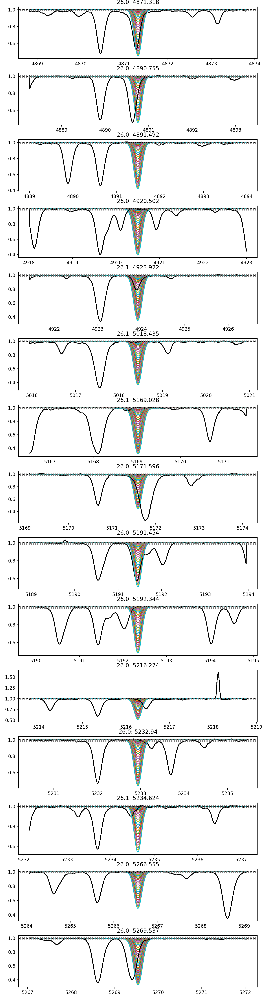

Starting line    1 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    2 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    3 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    4 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    5 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    6 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    7 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    8 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    9 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   10 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   11 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   12 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   13 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   14 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   15 of   15


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Elapsed time: 49 s


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


In [16]:
# Run MOOG looper to fit the lines!
line_dict = mf.moog_looper(name, 
                spectrum, 
                line_dict, 
                os.path.join( os.getcwd(), model_in),
                smogs = smogs, 
                abundances = test_abunds,
                retrim = True,
                trim_sigma = [5.0, 1.2],
                ul_sigma = 3.0,
                correct_rv = False,              
                print_prog = True, 
                plots = True)



In [17]:
#Tidy up the directory a little by removing the line list

# JG: as far as I can tell this linelist was created just to prevent accidental altering of the master line list
# we can delete it here and not lose any information 
print(line_list)
os.remove(line_list)

# We can remove the single line list now - we're done  with it
os.remove('single_line.txt')

linelist_best_Fe.txt


### Step 1.2: Removing bad Fe lines

The program will automatically flag a majority of the upper limits, and you can choose if you want to keep them in the analysis or not.

Some bad lines will still get through that you will have to  manually remove later.

Unless you already have a well curated linelist, I recommend setting "include_uls = False"

In [18]:
# Do you want the program to automatically remove upper limits?
include_uls = False # JG: Usually False, but True to check lines that were removed

test_dict = line_dict.copy()

#Define the new line list and MOOG outputs/parameters list
new_fe_list = name + '_good_Fe.txt'
fe_mlps = name + '_fe_mlps.txt'

#Calculate the best abundance and stats for each line
# Best abundances are where the residual between the observed and synthetic spectra are the smallest
test_dict = mf.find_best_abunds(test_dict, ul_sigma=3.0)


#Remove the upper limits from the line list and create a new trimmed list
mf.trim_2_good_list(test_dict, new_fe_list, fe_mlps, include_uls=include_uls)

No accurate upper limit found, increase abundance range
Writing file to HD222925Blue_good_Fe.txt
Writing file to HD222925Blue_fe_mlps.txt


### Step 1.3: Create a new model atmosphere based on the good Fe lines

"Though your stellar parameters may be within the grid boundaries, local gaps may cause problems. Tread carefully."
- Check stellar parameters and lines

In [19]:
#From the MOOG Fe lines/fit parameters file, calculate the new metallicity
mean_fe, mean_fe_err, n_fe = calc_abunds.calc_fe(fe_mlps, include_uls=True, print_new_Fe=True)

new_params = np.copy(params)
new_params[2] = round(mean_fe, 2)

print('New Params: ')

#Generate a new model atmosphere with the updated metallicity
aa.gen_mod_atm(name, new_params, working_path, print_params=True)

[Fe I/H] = -2.35 +/- 0.25 (6 lines)
[Fe II/H] = -3.74 +/- 0.4 (3 lines)
[Fe/H] = -2.74 +/- 0.72 ([9, 0.2469780317116243, 0.3959610904939842] lines)
New Params: 
-----------------------------------------------------------------
----------------- Generating a Model Atmosphere -----------------
-----------------------------------------------------------------

----------------- Finding model atmosphere parameters:
-The model atmosphere parameters are: 
['5636.0 2.54 -2.74 1.93 HD222925Blue']
-Saving model atmosphere parameters to: params.txt 
-Saving atoms to: atoms.txt


----------------- Finding which group of model atmosphere grids to use based on the log g coverage:
-/arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/


----------------- Creating the model atmospheres:
-Reading params.txt
-Grid coverage for models in /arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/:
Temperature range: 3800.0 K - 7500.0 K
Gravity range: 0.0 - 3.5
Metallicity range: -5.0 - 1.0
(Thou

gv: Unable to open the display.


### Step 1.4: Re-run the synthesis on the now truncated Fe line list to manually look for missed upper limits and/or blended lines.

The following cell will produce a plot with a panel for each synthesized line. You still need to examine each line by eye to make sure no bad lines slipped through the cracks.

To remove bad lines, you need to open the **name_good_Fe.txt** file AND the **name_Fe_mlps.txt** file and manually delete the lines which correspond to the bad lines.

Tip for success: python struggles to plot more than 100 subplots in a figure. If your linelist has more than 100 lines, I would recommend the following:

1) Duplicate the **name_good_Fe.txt** and **name_Fe_mlps.txt** files and rename the copies something helpful in the meantime - these are your backup files.

2) In the original **name_good_Fe.txt** and **name_Fe_mlps.txt** files, delete any lines after the first 100.

3) Run the cell below, remove any bad lines from the BACKUP files.

4) Copy/paste the next batch of lines from the backup files into the working files. 

5) Repeat above until your two backup files only contain good lines.

6) Copy/paste the full backup files into the original working files and delete the backups.

Be sure to look for the two Fe II lines at 4923 A and 5018 A.

#### JG: Following cell takes ~1min to run

<IPython.core.display.Javascript object>


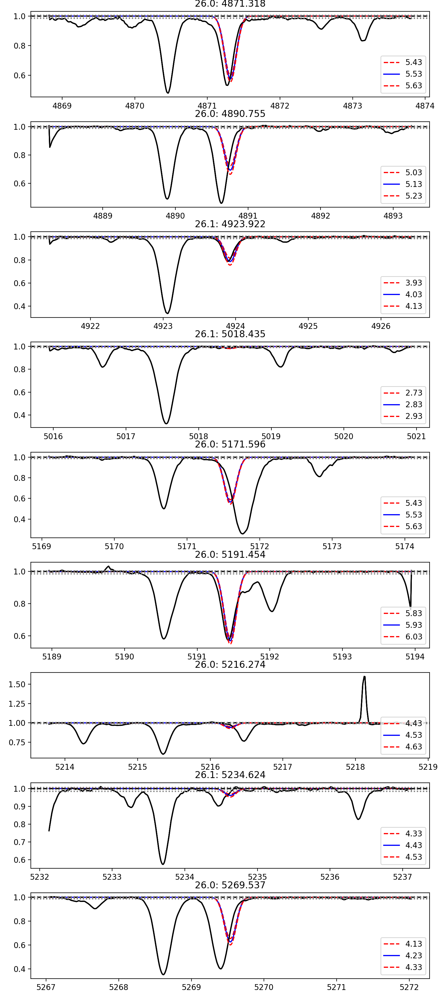

Starting line 1 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 2 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 3 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 4 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 5 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 6 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 7 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 8 of 9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 9 of 9
Elapsed time: 4 s


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


In [20]:
#Define the line list
line_list = new_fe_list

#Create a dictionary based on the line list
new_dict = mf.lines_2_dict(line_list, new_params)

new_dict = mf.moog_best_lines(name, spectrum, new_dict,
                os.path.join( os.getcwd(), model_in),
                fe_mlps,
                fe_lines = True,
                retrim = True,
                trim_sigma = [5.0, 1.2],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = True, 
                plots = True)

#### JG: I am lazy so I wrote a function which will remove specific lines from a list

In [34]:
remove_lines = [ float(line.strip()) for line in open('remove_lines.txt').readlines()]

llu.trim_lines_from_list(line_list, remove_lines)
llu.trim_lines_from_list(fe_mlps, remove_lines)

Saving trimmed list to HD222925Blue_good_Fe.txt
Saving trimmed list to HD222925Blue_fe_mlps.txt


In [35]:
# We can remove the single line list now - we're done  with it
os.remove('single_line.txt')

___
___

# Step 2: Re-run the synthesis on the final truncated Fe line list to determine a final [Fe/H]

In [55]:
# # If needed, tweak the stellar parameters based on the spectroscopic data
# new_params = [5107, 2.5, -3.00]

# # Generate a new model atmosphere with the updated metallicity
# mf.gen_mod_atm(name, new_params, working_path, print_params=True)

#### JG: The following cell took about 3min to run

In [21]:
# Determine more precise abundances
smogs = [0.17]

test_abunds = np.linspace(-1.0, 2.0, 61) # Increase the number of test abundances

# Create a dictionary based on the line list
new_dict = mf.lines_2_dict(line_list, new_params)

new_dict = mf.moog_looper(name, 
                spectrum, 
                new_dict, 
                os.path.join( os.getcwd(), model_in),
                smogs = smogs, abundances = test_abunds,
                retrim = True,
                trim_sigma = [5.0, 1.2],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = True, 
                plots = False)

Starting line    1 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    2 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    3 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    4 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    5 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    6 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    7 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    8 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    9 of    9


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Elapsed time: 41 s


sh: \rm: command not found


### Step 2.2: Trim bad lines again (if needed; this is unlikely), calculate the final Fe, and generate the final model atmosphere

In [22]:
test_dict = new_dict.copy()

# Calculate the best abundance and stats for each line
test_dict = mf.find_best_abunds(test_dict, ul_sigma=3.0)

# Remove the upper limits from the line list and create a new trimmed list
#JG: slight confusion here - dont we want the inlude_uls to be False
mf.trim_2_good_list(test_dict, new_fe_list, fe_mlps, include_uls=True) 

new_fe_list = name + '_good_Fe.txt'
fe_mlps = name + '_fe_mlps.txt'

# From the MOOG Fe lines/fit parameters file, calculate the new metallicity
mean_fe, mean_fe_err, n_fe = calc_abunds.calc_fe(fe_mlps, include_uls=True, print_new_Fe=True)

final_params = np.copy(new_params)
final_params[2] = round(mean_fe, 2)

print('Final Params:')

# Generate a new model atmosphere with the updated metallicity
aa.gen_mod_atm(name, final_params, working_path, print_params=True)

Writing file to HD222925Blue_good_Fe.txt
Writing file to HD222925Blue_fe_mlps.txt
[Fe I/H] = -2.31 +/- 0.25 (6 lines)
[Fe II/H] = -3.56 +/- 0.16 (3 lines)
[Fe/H] = -3.2 +/- 0.64 ([9, 0.2535224075128491, 0.16080814425662432] lines)
Final Params:
-----------------------------------------------------------------
----------------- Generating a Model Atmosphere -----------------
-----------------------------------------------------------------

----------------- Finding model atmosphere parameters:
-The model atmosphere parameters are: 
['5636.0 2.54 -3.2 1.96 HD222925Blue']
-Saving model atmosphere parameters to: params.txt 
-Saving atoms to: atoms.txt


----------------- Finding which group of model atmosphere grids to use based on the log g coverage:
-/arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/


----------------- Creating the model atmospheres:
-Reading params.txt
-Grid coverage for models in /arc5/home/jglover/ASAP/asap_lib/data/grids/standard/sphere/:
Temperature rang

gv: Unable to open the display.


# !!!
# The final model atmosphere information is NOT recorded in a file anywhere, but sure to write this information down for later use!
# !!!

### JG: I am confused by this comment since the model atmosphere params are saved.  They are saved to the file params.txt.  The final version of params.txt could be saved/copied under the name : name_mod_atm_params.txt or something like that.
I wrote a quick bit of code below which will save the parameters from params.txt in a special file....Maybe there is something else that needs to be saved though.
At the very end there is a couple lines of code which just rename the params.txt file and keep the exact same information.  so my chunk of code isnt needed

In [23]:
import pandas as pd

def convrt_2_float(i):
    try:
        return float(i)
    except ValueError:
        return i

finalparams = open('params.txt').readlines()

data = [   convrt_2_float(i) for i in finalparams[0].split() ]
data = [data[-1]] + data[0:-1]
df = pd.DataFrame(data=data ).T
df.columns = ['Name', 'Teff', 'logg', 'Metallicity', 'v_micro']

df.to_csv('finalModelAtm_'+name+'.csv')

### Step 2.3: Check the final fits to the Fe lines

Again, remember python has an issue plotting more than 100 subplots at a time

####  JG: The following cell took ~1min to run

<IPython.core.display.Javascript object>


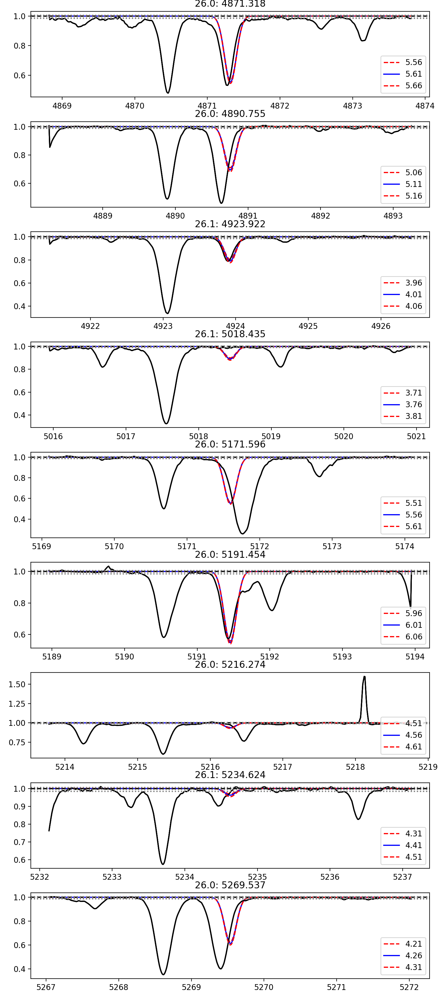

sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Saving the plot to HD222925Blue_5636_2.54_-3.2_fe_lines.png


In [24]:
# Define the line list
line_list = new_fe_list

# Create a dictionary based on the line list
final_fe_dict = mf.lines_2_dict(line_list, final_params)

# Name of the plot to save 
save_name =  name + '_' + str(int(round(final_params[0]))) + \
          '_' + str(round(final_params[1],2)) + '_' + str(round(final_params[2],2)) + \
          '_fe_lines'
        
final_fe_dict = mf.moog_best_lines(name, 
                spectrum, 
                final_fe_dict, 
                os.path.join( os.getcwd(),model_in),
                fe_mlps,
                fe_lines = True,
                retrim = True,
                trim_sigma = [5.0, 1.2],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = False, 
                plots = True,
                save_name=save_name)

#### Check the abundances from each line as a function excitation potential 
- The resulting plots should be flat
- Code Reference/Inspiration: Fredrico Sesito (SpectroTeffCheck.ipynb)

In [ ]:
calc_abunds.plot_Fe_ExciteAbund(fe_mlps)

___
___

# Step 3: Repeat above but for all other species (except blends and lines with HFS corrections)

## If [Fe/H] has already been determined, you can start here

In [ ]:
# You could write some lines here to read in the final stellar parameters and generate a model atmosphere.
# The fe_mlps file is needed later on, so be sure to assign it as well

# # Path to stellar params
# collin_info = '/astro/clkielty/Documents/GRACES/final_spec/GRACES_Parameters_MOOG_Synth.txt'

# # Read in the predetermined stellar parameters
# final_params, final_params_err = mf.moog_synth_params(pname, collin_info, errs=True)

# # Create a model atmosphere
# mf.gen_mod_atm(pname, final_params, working_path, print_params=True)

# print(final_params_err)

# # fe_mlps = '/Users/clkielty/Documents/Work/Pristine/GRACES/moog/synthetic/%s/%s_fe_mlps.txt' % (pname, pname)

### Step 3.2: First pass: Remove weak lines as before


In [25]:
working_path

'/arc5/home/jglover/ASAP/'

In [27]:
# Path to the linelists
# full_list_path = working_path + 'asap_lib/data/linelists/isolated_other_lists/'
full_list_path = working_path 

# line_list = 'linelist_U3859.txt' #'linelist_U4050.txt' #'linelist_noFe_xm.txt' #'linelist_noFe_xm.txt'
line_list = 'HD222925Blue_moogReducedList.txt'

# Copy the linelist here
# shutil.copy2(full_list_path + line_list, working_path)

# JG: Optional addition: Trim the line list to the wavelength range of the spectrum
mf.trim_linelist_2_spectrum(spectrum, line_list, ftype='xy')

# Create a dictionary for the linelist
line_dict = mf.lines_2_dict(line_list, final_params)

Saving trimmed line list to HD222925Blue_moogReducedList.txt


In [28]:
smogs = [0.17]

# Generate an array of test abundances to get a quick abundnace estimate (used for all species)
test_abunds = np.linspace(-2.0, 2.0, 21) #Steps of 0.2 dex

**JG: took 10min to run this next cell**

In [31]:
# Run the MOOG looper!

line_dict = mf.moog_looper(name, 
                spectrum, 
                line_dict, 
                os.path.join( os.getcwd(), model_in),
                smogs = smogs, 
                abundances = test_abunds,
                retrim = True,
                trim_sigma = [2.0, 2.0],
                ul_sigma = 3.0,
                correct_rv = False,              
                print_prog = True, 
                plots = False)

# os.remove(line_list)

Starting line    1 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    2 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    3 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    4 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    5 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    6 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    7 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    8 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line    9 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   10 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   11 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   12 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   13 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   14 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   15 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   16 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   17 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   18 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   19 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   20 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   21 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   22 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   23 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   24 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   25 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   26 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   27 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   28 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   29 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   30 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   31 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   32 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   33 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   34 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   35 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   36 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   37 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   38 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   39 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   40 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   41 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   42 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   43 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   44 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   45 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   46 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   47 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   48 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   49 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   50 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   51 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   52 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   53 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   54 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   55 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   56 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   57 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   58 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   59 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   60 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   61 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   62 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   63 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   64 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   65 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   66 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   67 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   68 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   69 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   70 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   71 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   72 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   73 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   74 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   75 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   76 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   77 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   78 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   79 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   80 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   81 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   82 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   83 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   84 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   85 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   86 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   87 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   88 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   89 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   90 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   91 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   92 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   93 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   94 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   95 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   96 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   97 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   98 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line   99 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  100 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  101 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  102 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  103 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  104 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  105 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  106 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  107 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  108 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  109 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  110 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  111 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  112 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  113 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  114 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  115 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  116 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  117 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  118 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  119 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  120 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  121 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  122 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  123 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  124 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  125 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  126 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  127 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  128 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  129 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  130 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  131 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  132 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  133 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  134 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  135 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  136 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  137 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  138 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  139 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  140 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  141 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  142 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  143 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  144 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  145 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  146 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  147 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  148 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  149 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  150 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  151 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  152 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  153 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  154 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  155 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  156 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  157 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  158 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  159 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  160 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  161 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  162 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  163 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  164 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  165 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  166 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  167 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  168 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  169 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  170 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  171 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  172 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  173 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  174 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  175 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  176 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  177 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  178 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  179 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  180 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  181 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  182 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  183 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  184 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  185 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  186 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  187 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  188 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  189 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  190 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  191 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  192 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  193 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  194 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  195 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  196 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  197 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  198 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  199 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  200 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  201 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  202 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  203 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  204 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  205 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  206 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  207 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  208 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  209 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  210 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  211 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  212 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  213 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  214 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  215 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  216 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  217 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  218 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  219 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  220 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  221 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  222 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  223 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  224 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  225 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  226 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  227 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  228 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  229 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  230 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  231 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  232 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  233 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  234 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  235 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  236 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  237 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  238 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  239 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  240 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  241 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  242 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  243 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  244 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  245 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  246 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  247 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  248 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  249 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  250 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  251 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  252 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  253 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  254 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  255 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  256 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  257 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  258 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  259 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  260 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  261 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  262 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  263 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  264 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  265 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  266 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  267 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  268 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  269 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  270 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  271 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  272 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  273 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  274 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  275 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  276 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  277 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  278 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  279 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  280 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  281 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  282 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  283 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  284 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  285 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  286 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  287 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  288 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  289 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  290 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  291 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  292 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  293 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  294 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  295 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  296 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  297 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  298 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  299 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  300 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  301 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  302 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  303 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  304 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  305 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  306 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  307 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  308 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  309 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  310 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  311 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  312 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  313 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  314 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  315 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  316 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  317 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  318 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  319 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  320 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  321 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  322 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  323 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  324 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  325 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  326 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  327 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  328 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  329 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  330 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  331 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  332 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  333 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  334 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  335 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  336 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  337 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  338 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  339 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  340 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  341 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  342 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  343 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  344 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  345 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  346 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  347 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  348 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  349 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  350 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  351 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  352 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  353 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  354 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  355 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  356 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  357 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  358 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  359 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  360 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  361 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  362 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  363 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  364 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  365 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  366 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  367 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  368 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  369 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  370 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  371 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  372 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  373 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  374 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  375 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  376 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  377 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  378 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  379 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  380 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  381 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  382 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  383 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  384 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  385 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  386 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  387 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  388 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  389 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  390 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  391 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  392 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  393 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  394 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  395 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  396 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  397 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  398 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  399 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  400 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  401 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  402 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  403 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  404 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line  405 of  405


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Elapsed time: 745 s


### Step 3.3: Create the truncated linelist (removing upper limits) and moog lines/parameters summary file as before



In [33]:
test_dict = line_dict.copy()

new_line_list = name + '_others.txt'
other_mlps = name + '_others_mlps.txt'

test_dict = mf.find_best_abunds(test_dict, ul_sigma=3.0)

mf.trim_2_good_list(test_dict, new_line_list, other_mlps, include_uls=False)

Writing file to HD222925Blue_others.txt
Writing file to HD222925Blue_others_mlps.txt


### Step 3.4: Plot the fits to the truncated line list as before assist in manually removing missed U.L's and blends

The following cell will produce a plot with a panel for each synthesized line. You still need to examine each line by eye to make sure no bad lines slipped through the cracks.

To remove bad lines, you need to open the **name_others.txt** file AND the **name_others_mlps.txt** file and manually delete the lines which correspond to the bad lines.

<IPython.core.display.Javascript object>


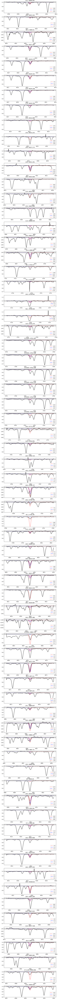

Starting line 1 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 2 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 3 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 4 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 5 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 6 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 7 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 8 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 9 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 10 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 11 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 12 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 13 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 14 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 15 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 16 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 17 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 18 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 19 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 20 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 21 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 22 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 23 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 24 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 25 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 26 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 27 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 28 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 29 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 30 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 31 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 32 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 33 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 34 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 35 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 36 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 37 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 38 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 39 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 40 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 41 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 42 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 43 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 44 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 45 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 46 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 47 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 48 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 49 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 50 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 51 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 52 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 53 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 54 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 55 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 56 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 57 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 58 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 59 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 60 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 61 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 62 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 63 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 64 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 65 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 66 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 67 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Starting line 68 of 68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


Elapsed time: 33 s


In [34]:
#Define the line list
line_list = new_line_list

#Create a dictionary based on the line list
new_dict = mf.lines_2_dict(line_list, final_params)

new_dict = mf.moog_best_lines(name, 
                spectrum, 
                new_dict, 
                os.path.join( os.getcwd(), model_in),
                other_mlps,
                retrim = True,
                trim_sigma = [5.0, 1.2],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = True, 
                plots = True)

#### JG: I am lazy so I wrote a function which will remove specific lines from a list

In [59]:
# remove_lines = [4616.124, 4636.32, 4657.201, 4779.985, 4792.432, 4792.482, 5206.088, 5206.195, 5210.384, 5772.146, 6126.216, 6169.042, 8662.141, 4964.927, 4981.731, 8542.091, 6493.781, 6462.567, 6169.563, 6102.723, 5899.294, 5857.451,  5594.462, 5476.904, 5265.556, 5188.68,  5172.684, 5208.409, 5206.023, 5183.604, 4702.991
# ]
remove_lines = [ float(line.strip()) for line in open('remove_lines.txt').readlines()]

llu.trim_lines_from_list(line_list, remove_lines)
llu.trim_lines_from_list(other_mlps, remove_lines)

Saving trimmed list to HD222925Blue_others.txt
Saving trimmed list to HD222925Blue_others_mlps.txt


**JG: the following cell takes about 3min-15min to run**

In [35]:
# Determine more precise abundances
smogs = [0.17]
test_abunds = np.linspace(-2.0, 2.0, 81)

# Create a dictionary based on the line list
new_dict = mf.lines_2_dict(line_list, final_params)

new_dict = mf.moog_looper(name, 
                spectrum, 
                new_dict, 
                os.path.join( os.getcwd(), model_in),
                smogs = smogs, abundances = test_abunds,
                retrim = True,
                trim_sigma = [5.0, 1.1],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = True, 
                plots = False)


Starting line    1 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    2 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    3 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    4 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    5 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    6 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    7 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    8 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line    9 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   10 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   11 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   12 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   13 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   14 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   15 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   16 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   17 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   18 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   19 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   20 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   21 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   22 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   23 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   24 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   25 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   26 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   27 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   28 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   29 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   30 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   31 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   32 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   33 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   34 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   35 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   36 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   37 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   38 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   39 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   40 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   41 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   42 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   43 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   44 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   45 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   46 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   47 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   48 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   49 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   50 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   51 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   52 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   53 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   54 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   55 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   56 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   57 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   58 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   59 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   60 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   61 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   62 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   63 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   64 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   65 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   66 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   67 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Starting line   68 of   68


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Elapsed time: 457 s


sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found


In [36]:
test_dict = new_dict.copy()

test_dict = mf.find_best_abunds(test_dict, ul_sigma = 3.0)

mf.trim_2_good_list(new_dict, new_line_list, other_mlps, include_uls = True)


Writing file to HD222925Blue_others.txt
Writing file to HD222925Blue_others_mlps.txt


In [37]:
# From the MOOG lines/fit parameters file, calculate the abundances/
calc_abunds.calc_XFe(other_mlps, fe_mlps, include_uls = True, print_info = True)

[Fe I/H] = -2.31 +/- 0.25 (6 lines)
[Fe II/H] = -3.56 +/- 0.16 (3 lines)
[Fe/H] = -3.2 +/- 0.64 ([9, 0.2535224075128491, 0.16080814425662432] lines)
[C I/Fe] = 1.93 +/- 0.91 (1 lines)
[Na I/Fe] = 2.0 +/- 0.64 (1 lines)
[Si I/Fe] = 2.4 +/- 0.64 (4 lines)
[Ti I/Fe] = 1.99 +/- 0.67 (6 lines)
[Ti II/Fe] = 1.9 +/- 0.81 (2 lines)
Missing 23.0051 in element dictionary.
[Cr I/Fe] = 1.93 +/- 0.64 (6 lines)
[Cr II/Fe] = 2.0 +/- 0.64 (1 lines)
Missing 25.0055 in element dictionary.
[Fe I/Fe] = 1.76 +/- 0.64 (23 lines)
[Fe II/Fe] = 0.76 +/- 0.81 (4 lines)
[Co I/Fe] = 2.0 +/- 0.64 (1 lines)
[Ni I/Fe] = 2.0 +/- 0.64 (2 lines)
[Zn I/Fe] = 1.5 +/- 0.64 (1 lines)
[Y II/Fe] = 2.0 +/- 0.64 (1 lines)
[Zr I/Fe] = 2.0 +/- 0.65 (1 lines)
[La II/Fe] = 2.0 +/- 0.64 (1 lines)
Missing 57.1139 in element dictionary.
[Ce II/Fe] = 2.0 +/- 0.73 (1 lines)
[Nd II/Fe] = 2.0 +/- 0.68 (1 lines)
[Sm II/Fe] = 2.0 +/- 0.64 (3 lines)


array([['C I', '1.93', '0.91', '1'],
       ['Na I', '2.0', '0.64', '1'],
       ['Si I', '2.4', '0.64', '4'],
       ['Ti I', '1.99', '0.67', '6'],
       ['Ti II', '1.9', '0.81', '2'],
       ['Cr I', '1.93', '0.64', '6'],
       ['Cr II', '2.0', '0.64', '1'],
       ['Fe I', '1.76', '0.64', '23'],
       ['Fe II', '0.76', '0.81', '4'],
       ['Co I', '2.0', '0.64', '1'],
       ['Ni I', '2.0', '0.64', '2'],
       ['Zn I', '1.5', '0.64', '1'],
       ['Y II', '2.0', '0.64', '1'],
       ['Zr I', '2.0', '0.65', '1'],
       ['La II', '2.0', '0.64', '1'],
       ['Ce II', '2.0', '0.73', '1'],
       ['Nd II', '2.0', '0.68', '1'],
       ['Sm II', '2.0', '0.64', '3']], dtype='<U32')

### Step 3.5: Check the final fits

<IPython.core.display.Javascript object>


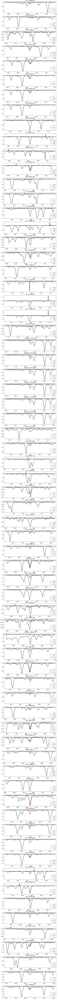

sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
sh: \rm: command not found
s

Saving the plot to HD222925Blue_5636_2.54_-3.2_other_lines.png


In [38]:
#Define the line list
line_list = new_line_list

#Create a dictionary based on the line list
final_lines_dict = mf.lines_2_dict(line_list, final_params)

save_name = name + '_' + str(int(round(final_params[0]))) + \
          '_' + str(round(final_params[1],2)) + '_' + str(round(final_params[2],2)) + \
          '_other_lines'

# save_name = name + '_' + str(int(round(final_params[0]))) + \
#           '_' + str(round(final_params[1],2)) + '_' + str(round(final_params[2],2)) + \
#           '_K_lines'

final_lines_dict = mf.moog_best_lines(name, 
                spectrum, 
                final_lines_dict,
                os.path.join( os.getcwd(), model_in),
                other_mlps,
                retrim = True,
                trim_sigma = [5.0, 1.1],
                ul_sigma = 3.0,
                correct_rv = False,
                print_prog = False, 
                plots = True,
                save_name=save_name)


---
# Clean up the files

In [56]:
# Cleanup the files

# Rename the final model atmosphere to have the final stellar params in the file name
new_model_name = name + '_' + str(int(round(final_params[0]))) + \
                '_' + str(round(final_params[1],2)) + '_' + str(round(final_params[2],2)) + '.mmod'
    
os.rename(os.path.join( os.getcwd(), model_in), new_model_name)

# Create a directory to place all the files in based on the name of the object
name_out_path = os.path.join(synth_out_path, name)

# If the path already exists, no need to remake it
if not os.path.isdir(name_out_path):
    os.mkdir(name_out_path)

# Move all relevant files to the output directory
all_files = os.listdir()
for file in all_files:
    if name in file:
        full = os.path.join(os.getcwd(), file)
        dest = os.path.join(name_out_path, file)
        shutil.move(full, dest)